<a href="https://colab.research.google.com/github/sj442/Kaggle-Playground-s5e3/blob/master/S5e3_Rainfall_prediction_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [ ]:
from google.colab import files
files.upload()

In [ ]:
! pip install -q kaggle

! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

!pip install sweetviz ydata-profiling dtale

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, roc_auc_score

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [ ]:
# Synthetic dataset for competition
! kaggle competitions download -c playground-series-s5e3

# Original dataset
! kaggle datasets download subho117/rainfall-prediction-using-machine-learning

Dataset URL: https://www.kaggle.com/datasets/subho117/rainfall-prediction-using-machine-learning
License(s): MIT


# Data

In [ ]:
import zipfile

with zipfile.ZipFile('playground-series-s5e3.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/kaggle/')

with zipfile.ZipFile('rainfall-prediction-using-machine-learning.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/kaggle/')

In [ ]:
train = pd.read_csv('/content/kaggle/train.csv')
test = pd.read_csv('/content/kaggle/test.csv')
sub = pd.read_csv('/content/kaggle/sample_submission.csv')
orig = pd.read_csv('/content/kaggle/Rainfall.csv')

In [ ]:
orig.columns = ['day', 'pressure', 'maxtemp', 'temparature', 'mintemp', 'dewpoint', 'humidity', 'cloud', 'rainfall', 'sunshine', 'winddirection',  'windspeed']

# High level stats

In [ ]:
# Display basic info
print(train.info())  # Data types and missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2190 entries, 0 to 2189
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             2190 non-null   int64  
 1   day            2190 non-null   int64  
 2   pressure       2190 non-null   float64
 3   maxtemp        2190 non-null   float64
 4   temparature    2190 non-null   float64
 5   mintemp        2190 non-null   float64
 6   dewpoint       2190 non-null   float64
 7   humidity       2190 non-null   float64
 8   cloud          2190 non-null   float64
 9   sunshine       2190 non-null   float64
 10  winddirection  2190 non-null   float64
 11  windspeed      2190 non-null   float64
 12  rainfall       2190 non-null   int64  
dtypes: float64(10), int64(3)
memory usage: 222.6 KB
None


In [ ]:
train.describe()

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed,rainfall
count,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000
mean,1094.500000,179.948402,1013.602146,26.365799,23.953059,22.170091,20.454566,82.036530,75.721918,3.744429,104.863151,21.804703,0.753425
std,632.342866,105.203592,5.655366,5.654330,5.222410,5.059120,5.288406,7.800654,18.026498,3.626327,80.002416,9.898659,0.431116
min,0.000000,1.000000,999.000000,10.400000,7.400000,4.000000,-0.300000,39.000000,2.000000,0.000000,10.000000,4.400000,0.000000
25%,547.250000,89.000000,1008.600000,21.300000,19.300000,17.700000,16.800000,77.000000,69.000000,0.400000,40.000000,14.125000,1.000000
50%,1094.500000,178.500000,1013.000000,27.800000,25.500000,23.850000,22.150000,82.000000,83.000000,2.400000,70.000000,20.500000,1.000000
75%,1641.750000,270.000000,1017.775000,31.200000,28.400000,26.400000,25.000000,88.000000,88.000000,6.800000,200.000000,27.900000,1.000000
max,2189.000000,365.000000,1034.600000,36.000000,31.500000,29.800000,26.700000,98.000000,100.000000,12.100000,300.000000,59.500000,1.000000


In [ ]:
train.head()

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed,rainfall
0,0,1,1017.4,21.2,20.6,19.9,19.4,87.0,88.0,1.1,60.0,17.2,1
1,1,2,1019.5,16.2,16.9,15.8,15.4,95.0,91.0,0.0,50.0,21.9,1
2,2,3,1024.1,19.4,16.1,14.6,9.3,75.0,47.0,8.3,70.0,18.1,1
3,3,4,1013.4,18.1,17.8,16.9,16.8,95.0,95.0,0.0,60.0,35.6,1
4,4,5,1021.8,21.3,18.4,15.2,9.6,52.0,45.0,3.6,40.0,24.8,0


In [ ]:
from ydata_profiling import ProfileReport

# Generate and display report
profile = ProfileReport(train, explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 80.51it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Cleaning & Imputing missing values

In [ ]:
# Changing the original dataset rainfall column to match training data

# 75% : 25% ratio of 1:0 in training data
# 68% : 32% ratio of 1:0 in original data
mapping_dict = {'yes': 1, 'no': 0}
orig['rainfall'] = orig['rainfall'].map(mapping_dict)


# 1 missing value in the windspeed and winddirection column in original dataset
orig['windspeed'] = orig['windspeed'].fillna(orig.windspeed.mean())
orig['winddirection'] = orig['winddirection'].fillna(orig.winddirection.mean())

# 1 missing value in the winddirection column in test dataset
test['winddirection']= test['winddirection'].fillna(test.winddirection.mean())

Target = 'rainfall'
Features = train.columns.drop([Target, 'id'])

# EDA

## Univariate Analysis

### Numerical Features EDA

['day', 'pressure', 'maxtemp', 'temparature', 'mintemp', 'dewpoint', 'humidity', 'cloud', 'sunshine', 'winddirection', 'windspeed']


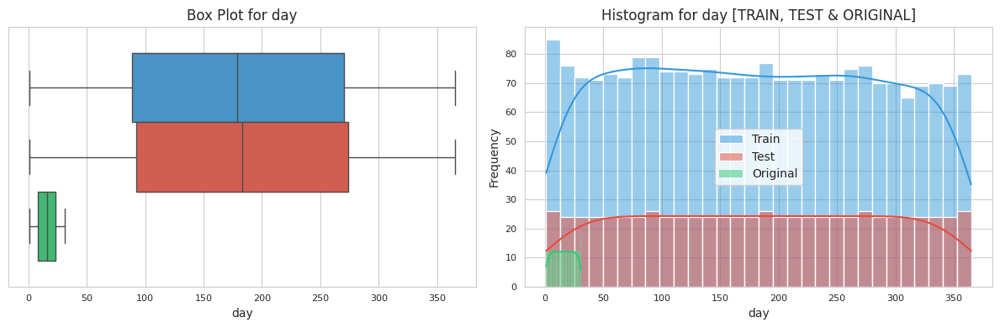

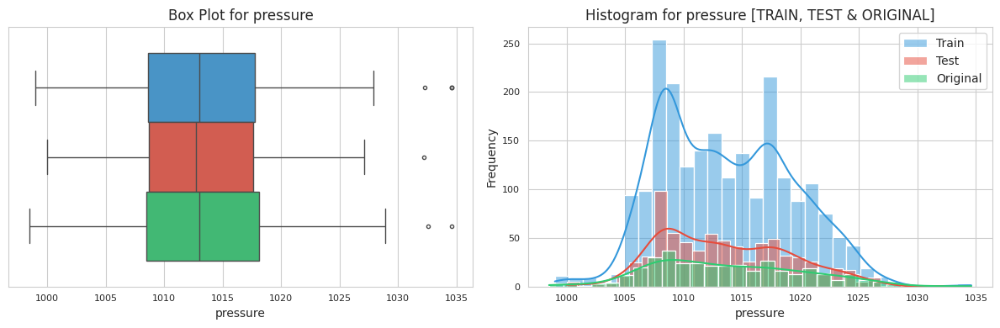

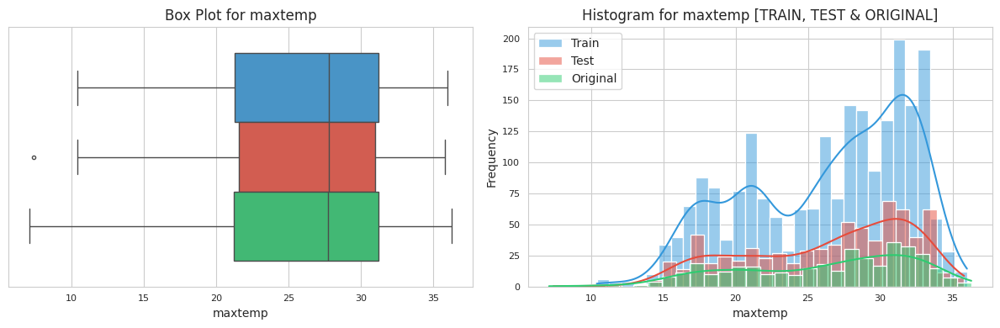

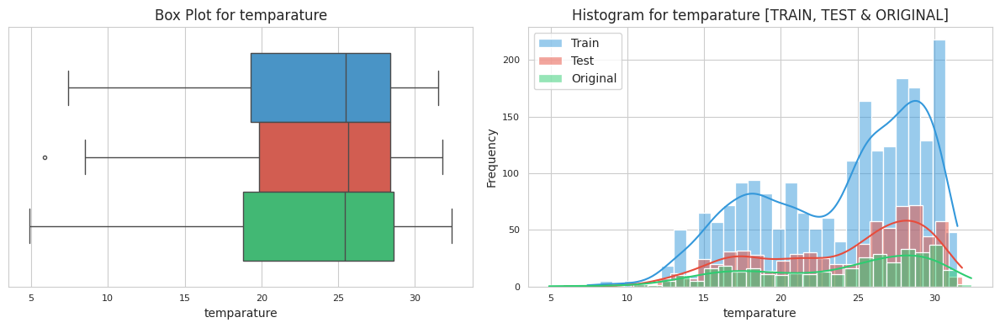

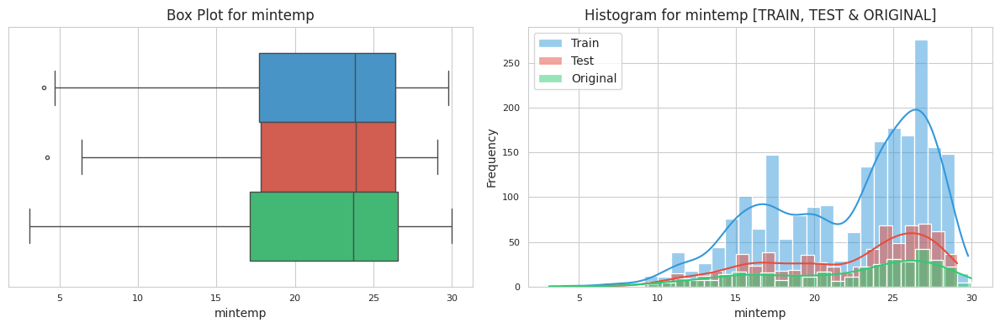

...

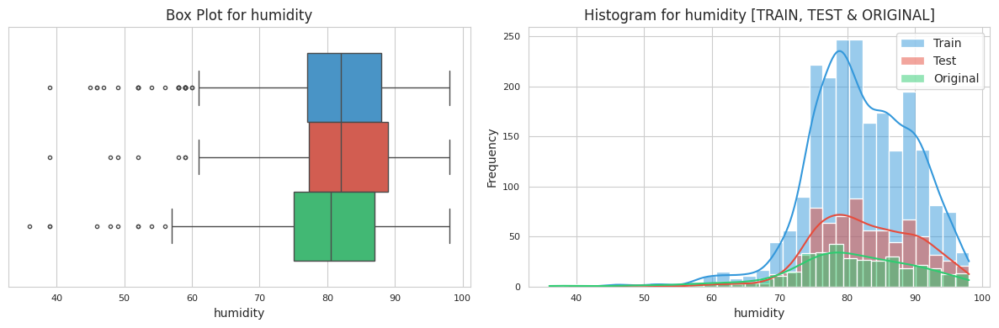

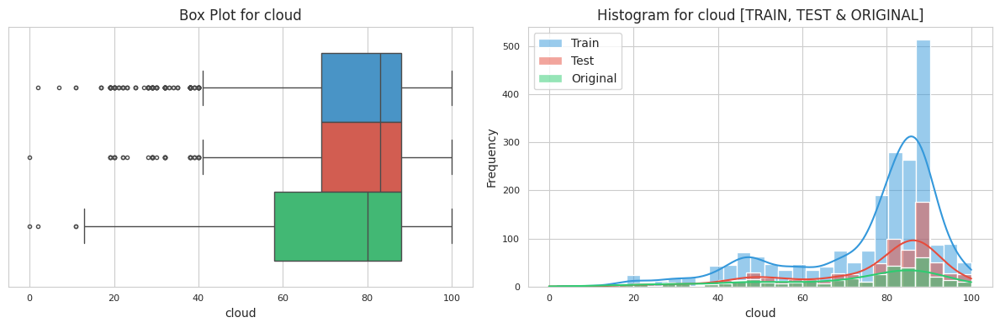

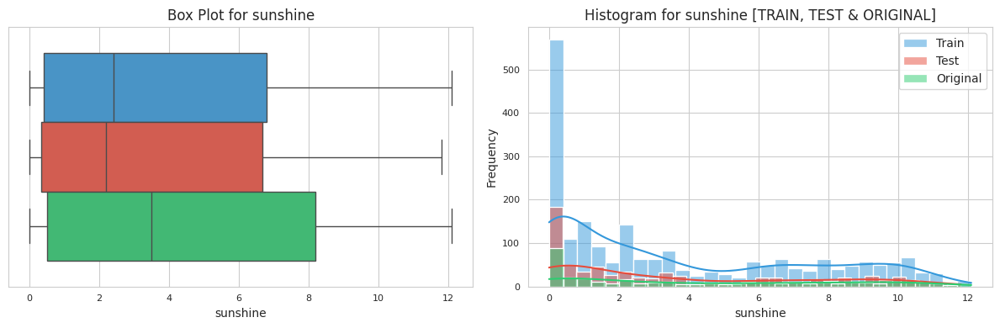

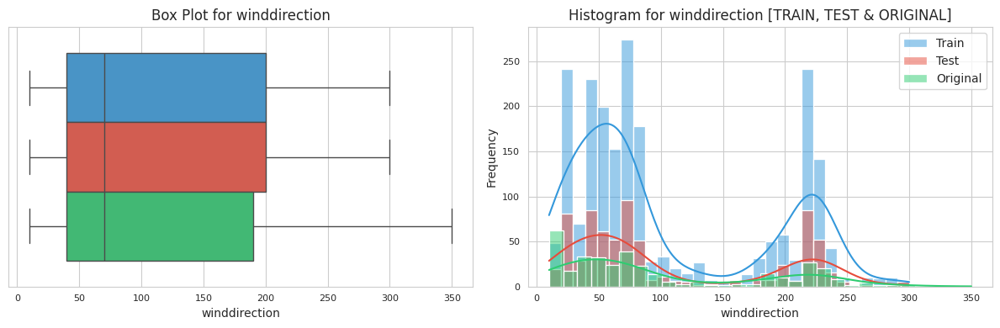

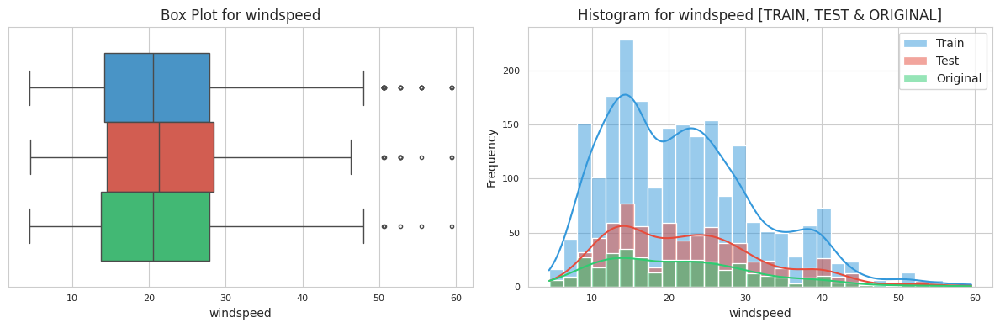

In [ ]:
# Analysis of all NUMERICAL features
numerical_variables = train.select_dtypes(include=['int64', 'float64']).columns.drop([Target, 'id']).tolist()
print(numerical_variables)

# Define a custom color palette
custom_palette = ['#3498db', '#e74c3c','#2ecc71']

# Add 'Dataset' column to distinguish between train and test data
train['Dataset'] = 'Train'
test['Dataset'] = 'Test'
orig['Dataset'] = 'Original'

# Function to create and display a row of plots for a single variable
def create_variable_plots(variable):
    sns.set_style('whitegrid')

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # Box plot
    plt.subplot(1, 2, 1)
    sns.boxplot(data=pd.concat([train, test, orig.dropna()]), x=variable, hue="Dataset", palette=custom_palette, legend=False)
    plt.xlabel(variable)
    plt.title(f"Box Plot for {variable}")

    # Separate Histograms
    plt.subplot(1, 2, 2)
    sns.histplot(data=train, x=variable, color=custom_palette[0], kde=True, bins=30, label="Train")
    sns.histplot(data=test, x=variable, color=custom_palette[1], kde=True, bins=30, label="Test")
    sns.histplot(data=orig.dropna(), x=variable, color=custom_palette[2], kde=True, bins=30, label="Original")
    plt.xlabel(variable)
    plt.ylabel("Frequency")
    plt.title(f"Histogram for {variable} [TRAIN, TEST & ORIGINAL]")
    plt.legend()

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plots
    plt.show()

# Perform univariate analysis for each variable
for variable in numerical_variables:
    create_variable_plots(variable)

# Drop the 'Dataset' column after analysis
train.drop('Dataset', axis=1, inplace=True)
test.drop('Dataset', axis=1, inplace=True)
orig.drop('Dataset', axis=1, inplace=True)

### Categorical Features EDA

In [ ]:
categorical_variables = ['winddirection']
print(categorical_variables)

['winddirection']


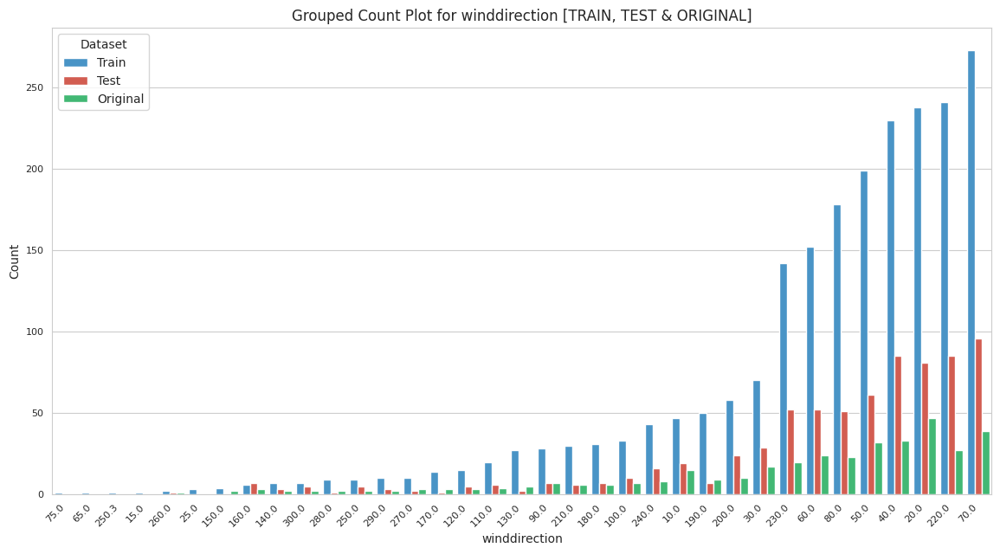

In [ ]:
# Define colors for Train, Test, and Original data
custom_palette = ['#3498db', '#e74c3c', '#2ecc71']  # Blue, Red, Green

# Function to create and display a grouped count plot for a single categorical variable
def create_categorical_barplot(variable):
    sns.set_style('whitegrid')

    # Combine the datasets and create a new column indicating the source
    train_data_copy = train.copy()
    test_data_copy = test.copy()
    original_data_copy = orig.dropna().copy()

    train_data_copy['Dataset'] = 'Train'
    test_data_copy['Dataset'] = 'Test'
    original_data_copy['Dataset'] = 'Original'

    combined_data = pd.concat([train_data_copy, test_data_copy, original_data_copy]).reset_index(drop=True)

    # Get sorted order of categories based on Train data count (small to big)
    train_counts = train[variable].value_counts().sort_values(ascending=True).index.tolist()

    # Plot grouped countplot (Horizontal bars)
    plt.figure(figsize=(14, 7))
    sns.countplot(
        data=combined_data,
        x=variable,  # Swapped axes
        hue="Dataset",
        palette=custom_palette,
        dodge=True,  # Ensures grouped bars
        width=0.85,  # Further increased bar width
        order=train_counts  # Sorting categories by Train data count (small to big)
    )

    plt.ylabel("Count")
    plt.xlabel(variable)
    plt.title(f"Grouped Count Plot for {variable} [TRAIN, TEST & ORIGINAL]")
    plt.legend(title="Dataset")

    # Rotate x labels for better visibility
    plt.xticks(rotation=45, ha="right")

    # Show the plot
    plt.show()

# Perform univariate analysis for each categorical variable
for variable in categorical_variables:
    create_categorical_barplot(variable)

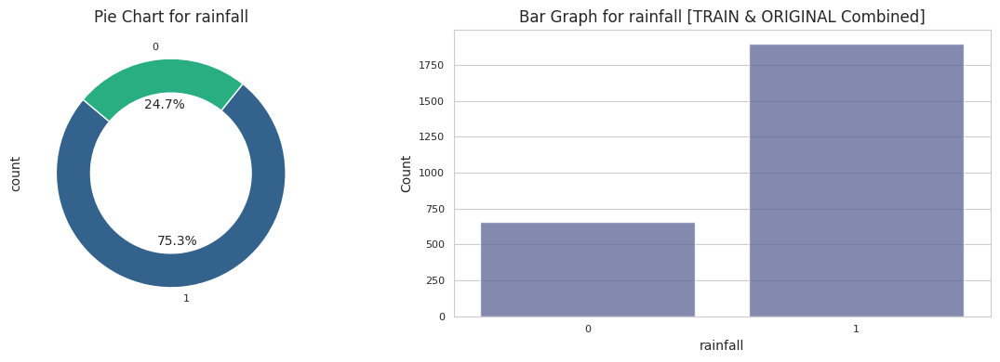

In [ ]:
pie_chart_palette = ['#33638d', '#28ae80', '#d3eb0c', '#ff9a0b', '#7e03a8', '#35b779', '#fde725', '#440154', '#90d743', '#482173', '#22a884', '#f8961e']

countplot_color = '#5C67A3'

# Function to create and display a row of plots for a single target variable
def create_target_plots(variable):
    sns.set_style('whitegrid')

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # Pie Chart
    plt.subplot(1, 2, 1)
    train[variable].value_counts().plot.pie(
        autopct='%1.1f%%', colors=pie_chart_palette, wedgeprops=dict(width=0.3), startangle=140
    )
    plt.title(f"Pie Chart for {variable}")

    # Bar Graph
    plt.subplot(1, 2, 2)
    sns.countplot(
        data=pd.concat([train, orig.dropna()]),
        x=variable,
        color=countplot_color,  # Using a single color for the countplot
        alpha=0.8  # Setting 80% opacity
    )
    plt.xlabel(variable)
    plt.ylabel("Count")
    plt.title(f"Bar Graph for {variable} [TRAIN & ORIGINAL Combined]")

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plots
    plt.show()

# Perform univariate analysis for target variable
create_target_plots(Target)

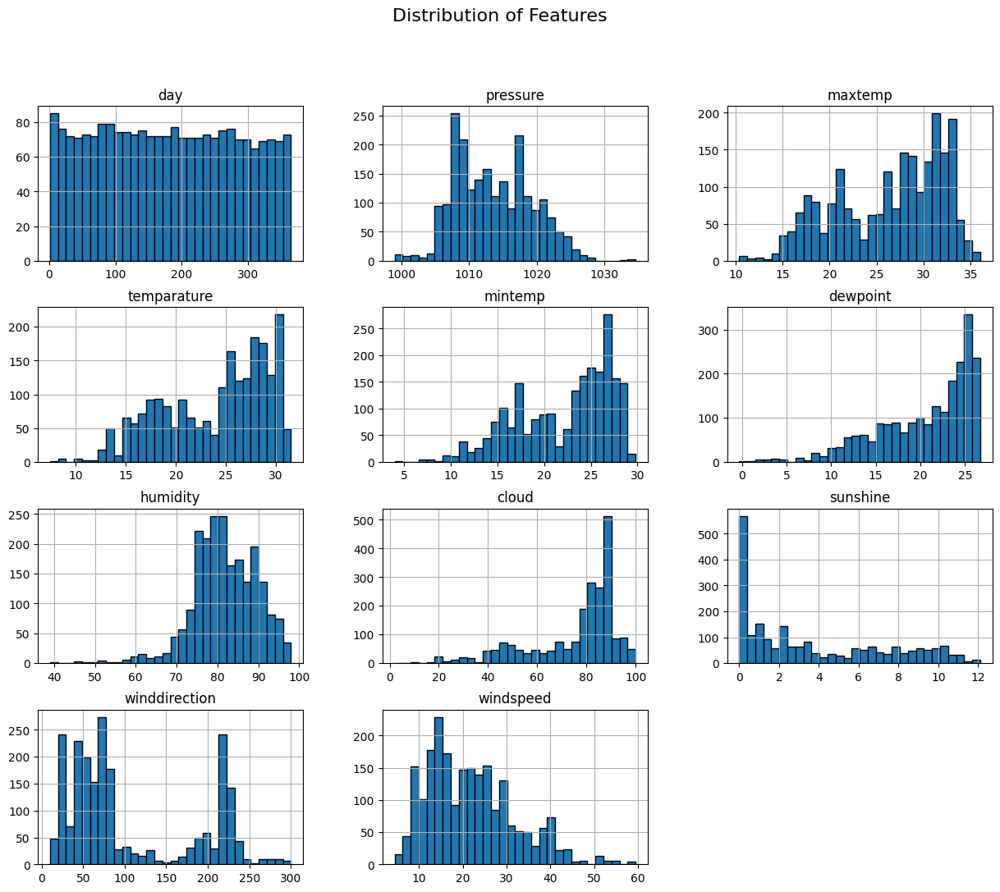

In [ ]:
# Histogram of training features only
train[Features].hist(figsize=(15, 12), bins=30, edgecolor="black", layout=(4, 3))
plt.suptitle("Distribution of Features", fontsize=16)
plt.show()

## Bivariate Analysis

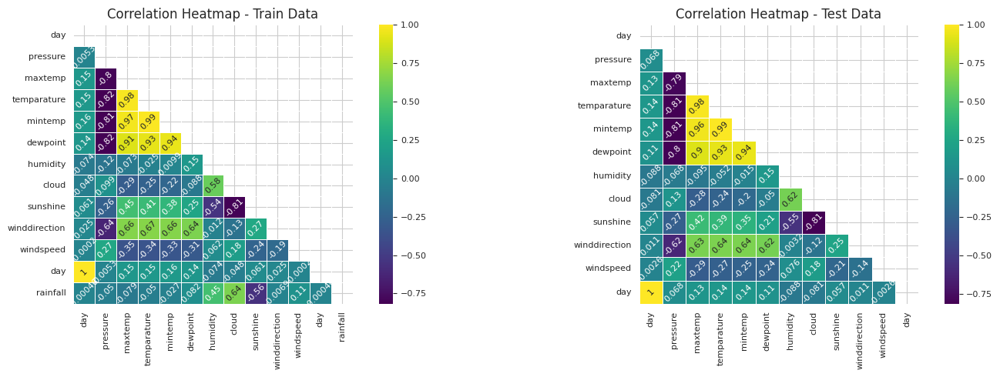

In [ ]:
variables = [col for col in train.columns if col in numerical_variables]+['day']

# Adding variables to the existing list
test_variables = variables
train_variables = variables+ [Target]

# Calculate correlation matrices for train_data and test_data
corr_train = train[train_variables].corr()
corr_test = test[test_variables].corr()

# Create masks for the upper triangle
mask_train = np.triu(np.ones_like(corr_train, dtype=bool))
mask_test = np.triu(np.ones_like(corr_test, dtype=bool))

# Set the text size and rotation
annot_kws = {"size": 8, "rotation": 45}

# Generate heatmaps for train_data
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
ax_train = sns.heatmap(corr_train, mask=mask_train, cmap='viridis', annot=True,
                      square=True, linewidths=.5, xticklabels=1, yticklabels=1, annot_kws=annot_kws)
plt.title('Correlation Heatmap - Train Data')

# Generate heatmaps for test_data
plt.subplot(1, 2, 2)
ax_test = sns.heatmap(corr_test, mask=mask_test, cmap='viridis', annot=True,
                     square=True, linewidths=.5, xticklabels=1, yticklabels=1, annot_kws=annot_kws)
plt.title('Correlation Heatmap - Test Data')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


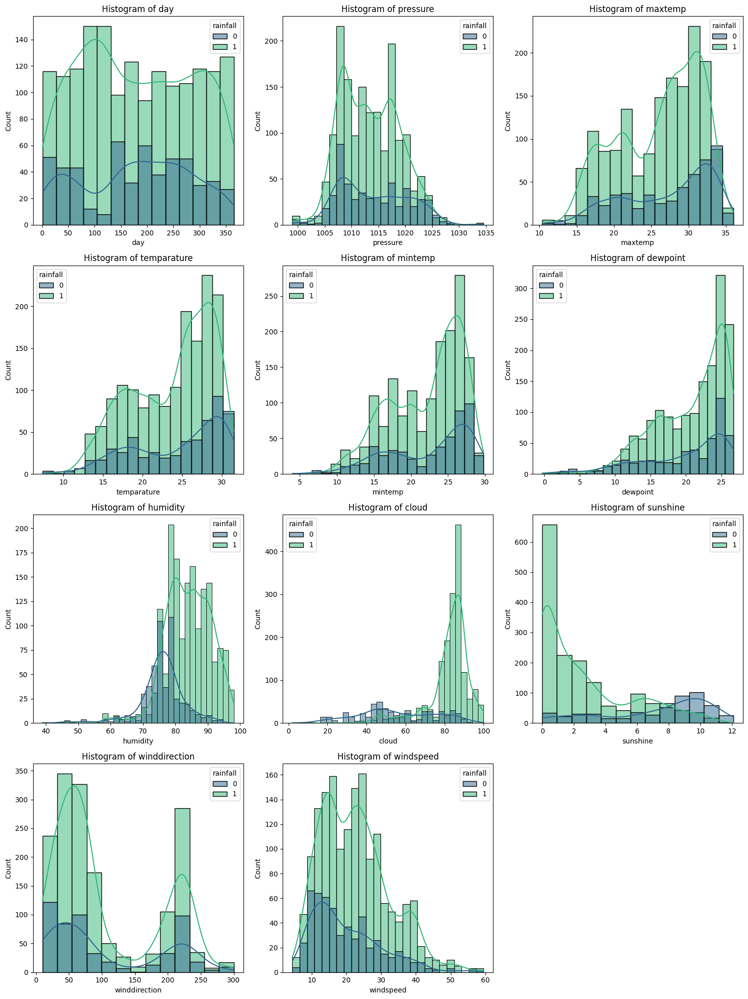

In [ ]:
num_features = len(Features)
cols = 3  # Number of columns in the grid
rows = (num_features // cols) + (num_features % cols > 0)  # Dynamically determine rows

# Set figure size
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
axes = axes.flatten()  # Flatten in case of 2D array

# Plot each feature's boxplot
for i, feature in enumerate(Features):
  sns.histplot(data=train, x=feature, hue='rainfall', palette='viridis', kde = True, ax=axes[i])
  axes[i].set_title(f"Histogram of {feature}")

# Hide any unused subplots (if num_features < rows * cols)
for i in range(num_features, len(axes)):
    fig.delaxes(axes[i])  # Remove empty plots

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

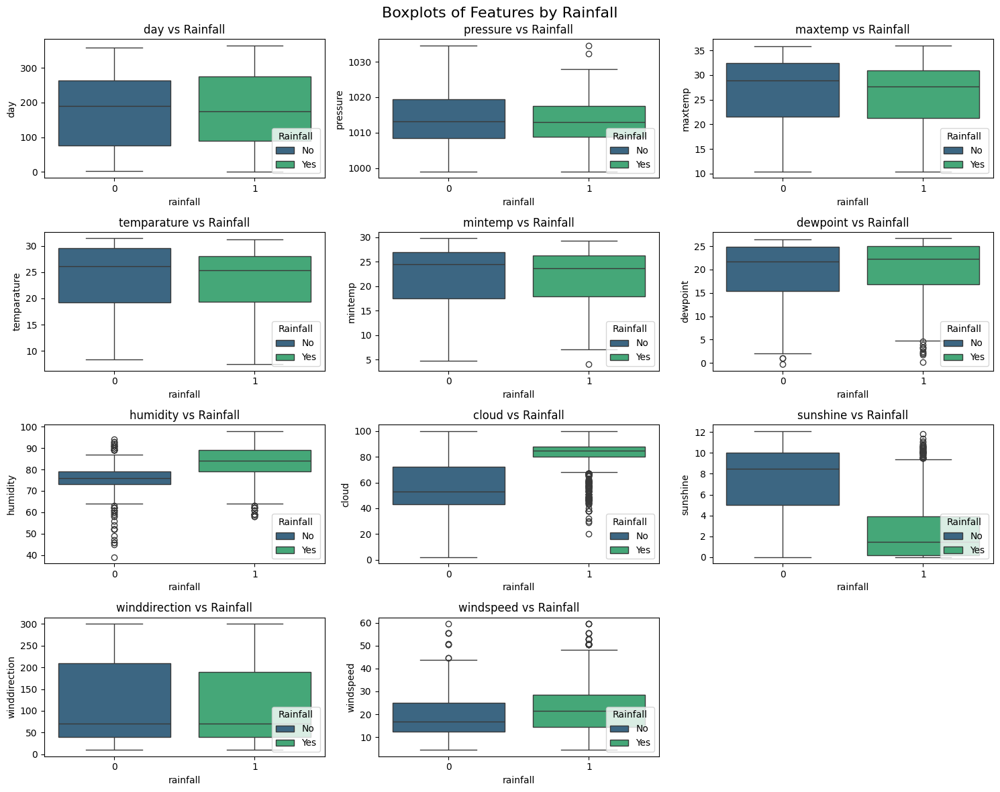

In [ ]:
plt.figure(figsize=(15, 12))
for i, col in enumerate(Features):
    plt.subplot(4, 3, i + 1)
    sns.boxplot(x=train["rainfall"], y=train[col], hue=train['rainfall'], palette='viridis')
    plt.title(f"{col} vs Rainfall")
    plt.legend(title="Rainfall", loc="lower right", labels=["No", "Yes"])
plt.suptitle("Boxplots of Features by Rainfall", fontsize=16)
plt.tight_layout()
plt.show()

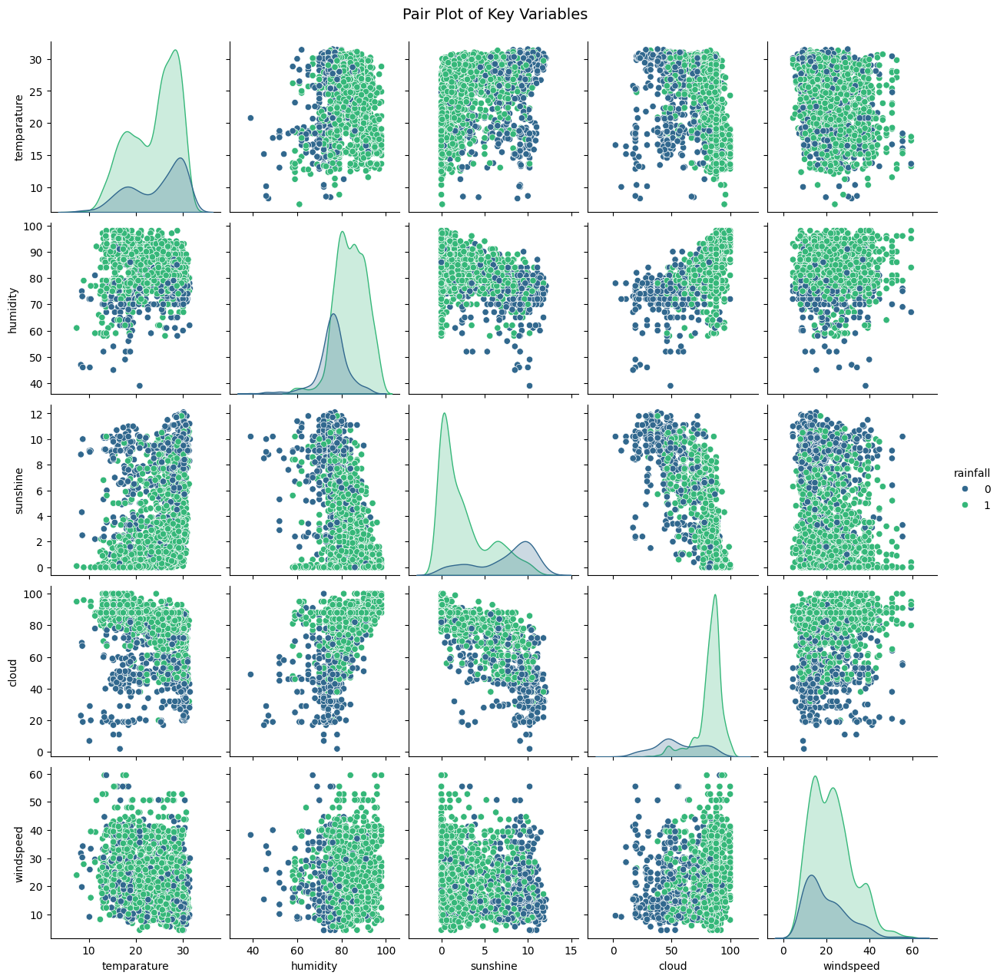

In [ ]:
sns.pairplot(train, vars=['temparature', 'humidity', 'sunshine', 'cloud', 'windspeed'], hue='rainfall', palette='viridis', diag_kind='kde')
plt.suptitle('Pair Plot of Key Variables', y=1.02, fontsize=14)
plt.show()

## Time Series Analysis

In [ ]:
# Define colors for Train, Test, and Original data
custom_palette = ['#3498db', '#e74c3c', '#2ecc71']  # Blue, Red, Green

# Generate the expected repeating pattern (1-365 for 6 years)
expected_pattern = np.tile(np.arange(1, 366), 6)  # Repeats 1-365 exactly 6 times

# Check for incorrect labels
train['expected_day'] = expected_pattern[:len(train)]  # Assign expected pattern
train['day_mismatch'] = train['day'] != train['expected_day']  # Flag mismatches

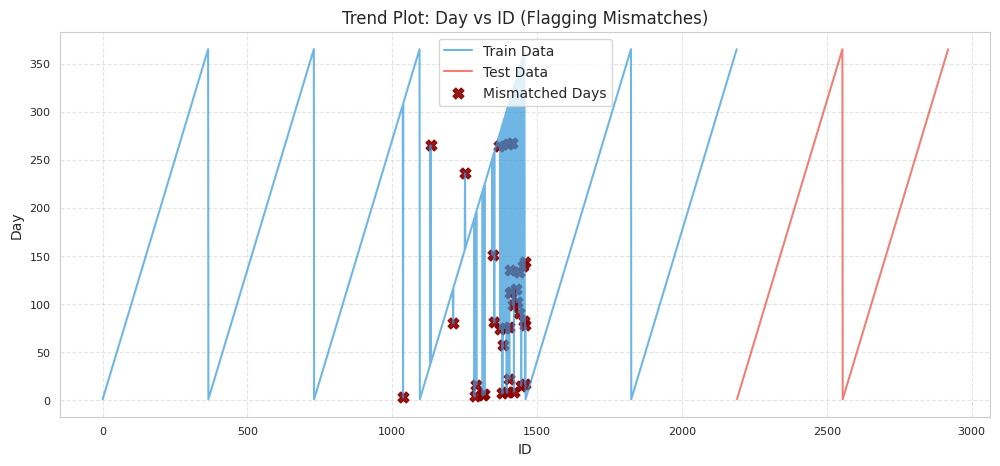

In [ ]:
flag_color = '#8B0000'   # Dark Red (for mismatched days)

# Generate expected repeating pattern (1-365 for 6 years)
expected_pattern = np.tile(np.arange(1, 366), 6)  # Repeats 1-365 exactly 6 times

# Assign expected pattern and flag mismatches
train['expected_day'] = expected_pattern[:len(train)]
train['day_mismatch'] = train['day'] != train['expected_day']  # Boolean flag

# Create the plot
plt.figure(figsize=(12, 5))

# Plot Train Data
plt.plot(train['id'], train['day'], linestyle='-', color=custom_palette[0], label='Train Data', alpha=0.7)

# Plot Test Data
plt.plot(test['id'], test['day'], linestyle='-', color=custom_palette[1], label='Test Data', alpha=0.7)

# Flag mismatched days using red markers
plt.scatter(
    train.loc[train['day_mismatch'], 'id'],  # X-axis: IDs of mismatched days
    train.loc[train['day_mismatch'], 'day'], # Y-axis: Corresponding incorrect days
    color=flag_color, marker='X', s=60, label='Mismatched Days', alpha=0.9
)

# Formatting
plt.xlabel('ID')
plt.ylabel('Day')
plt.title('Trend Plot: Day vs ID (Flagging Mismatches)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

# Show plot
plt.show()


<ipython-input-39-96752400162a>:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(title='Rainfall', fontsize=12, title_fontsize=12)


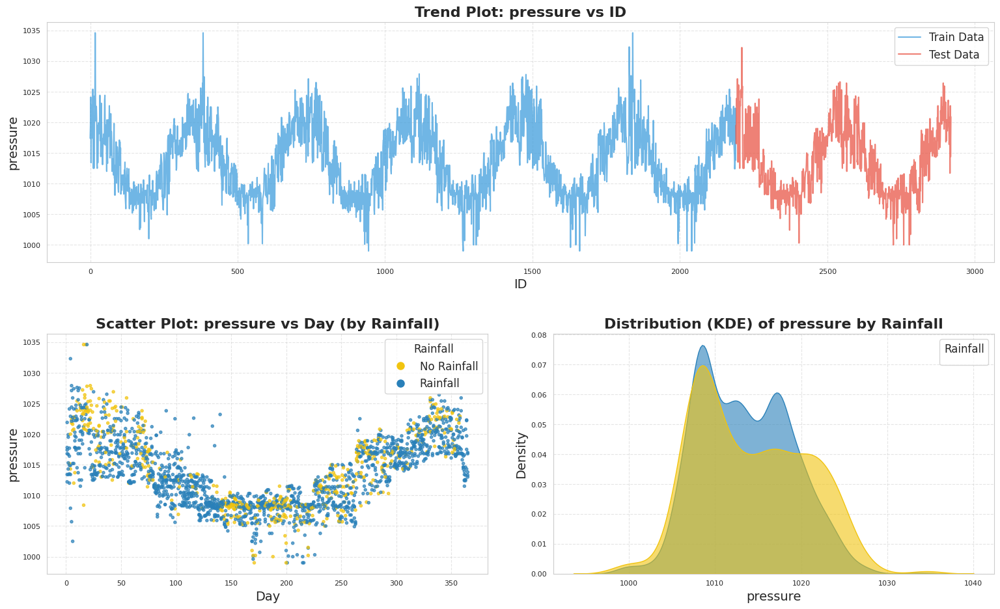

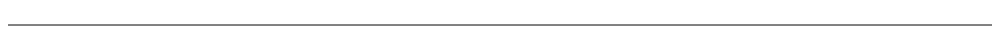

<ipython-input-39-96752400162a>:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(title='Rainfall', fontsize=12, title_fontsize=12)


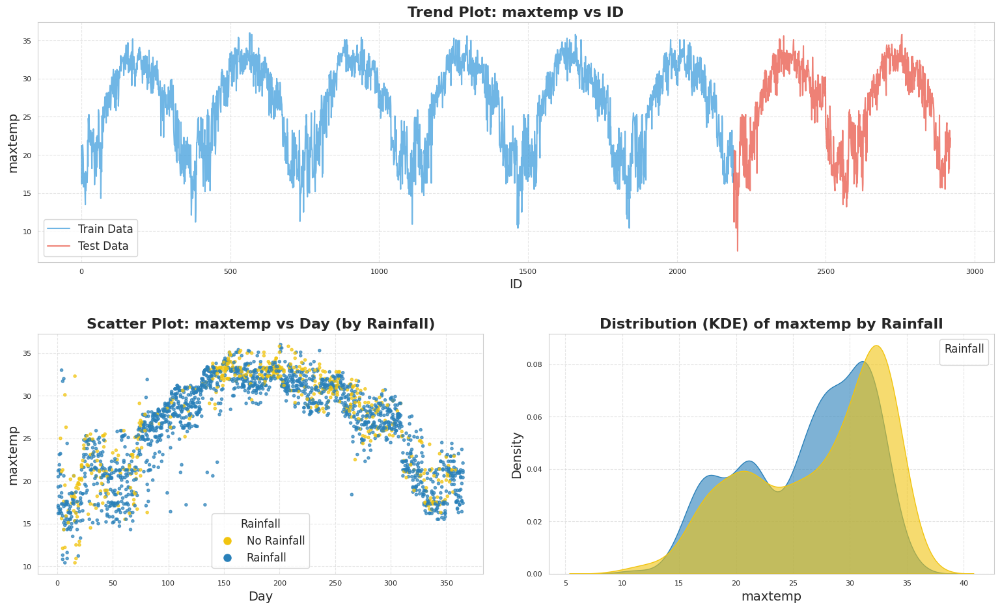

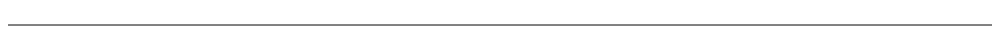

<ipython-input-39-96752400162a>:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(title='Rainfall', fontsize=12, title_fontsize=12)


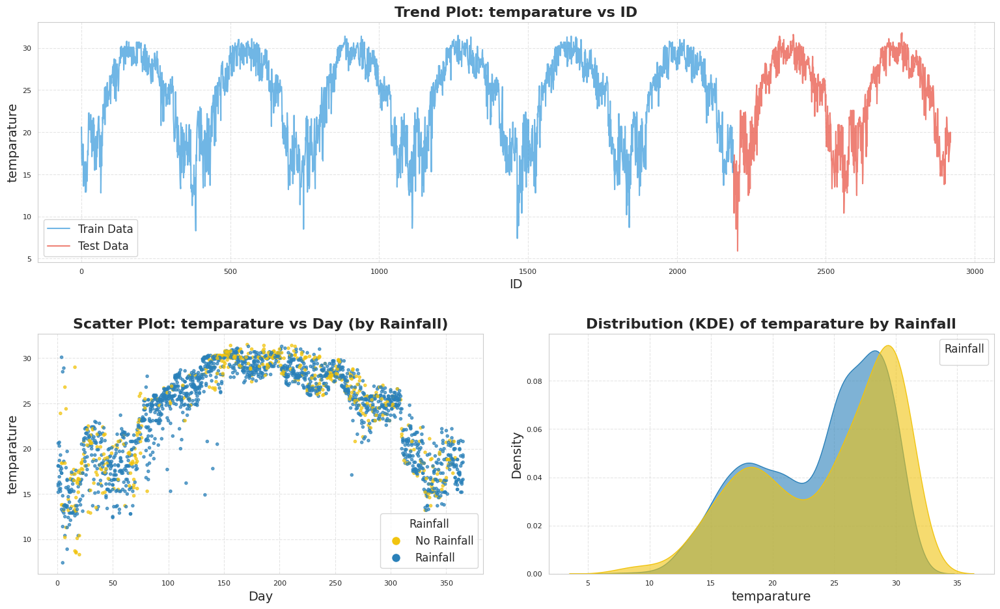

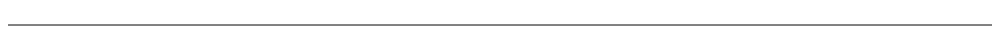

<ipython-input-39-96752400162a>:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(title='Rainfall', fontsize=12, title_fontsize=12)


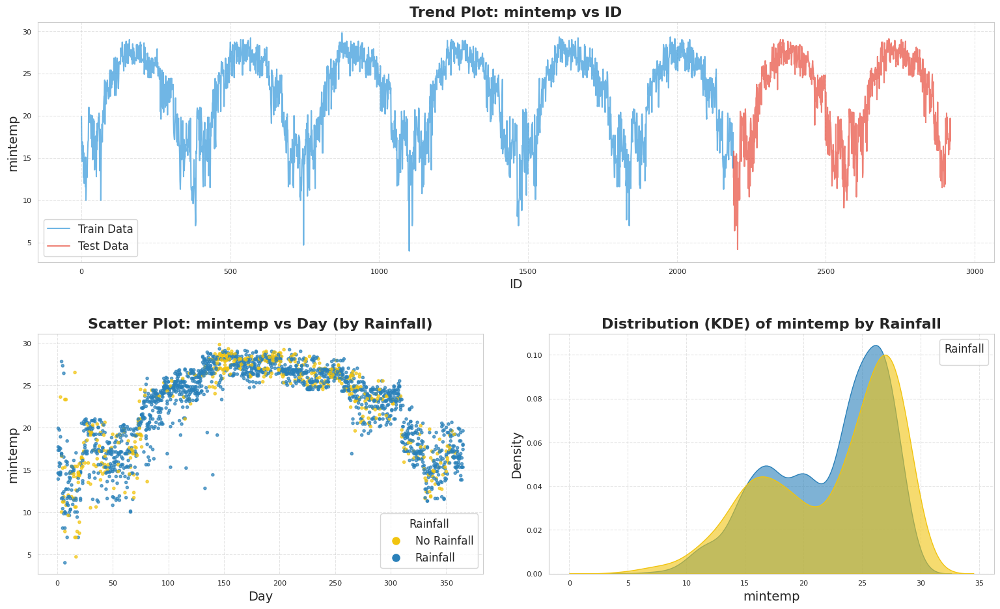

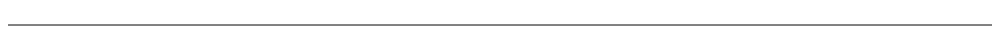

<ipython-input-39-96752400162a>:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(title='Rainfall', fontsize=12, title_fontsize=12)


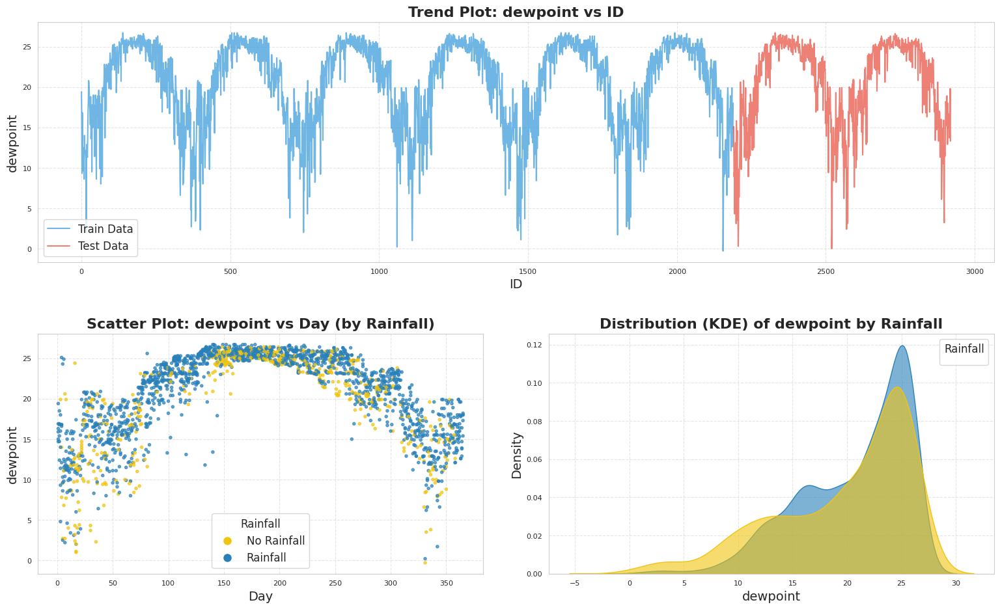

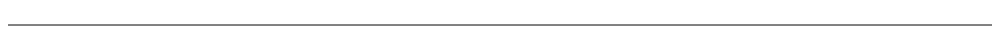

<ipython-input-39-96752400162a>:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(title='Rainfall', fontsize=12, title_fontsize=12)


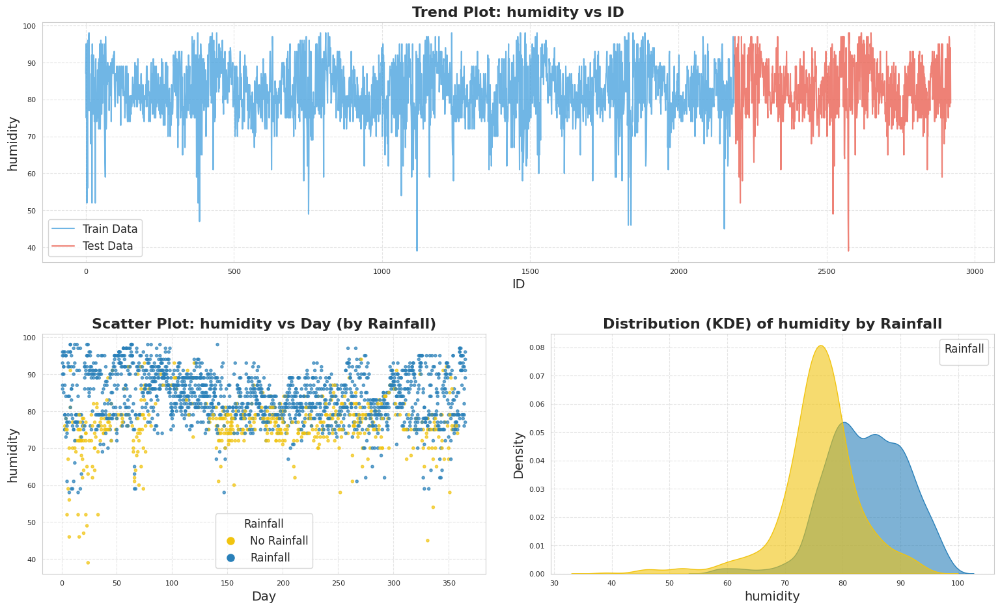

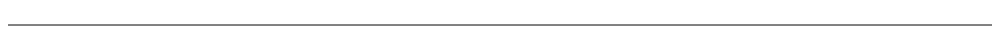

<ipython-input-39-96752400162a>:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(title='Rainfall', fontsize=12, title_fontsize=12)


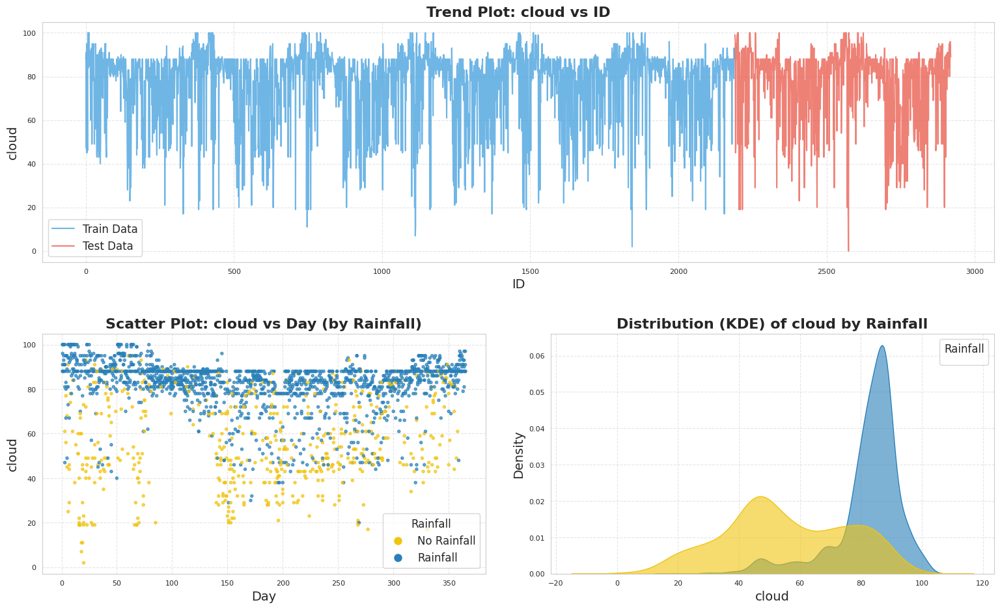

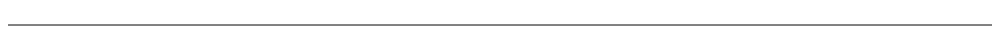

<ipython-input-39-96752400162a>:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(title='Rainfall', fontsize=12, title_fontsize=12)


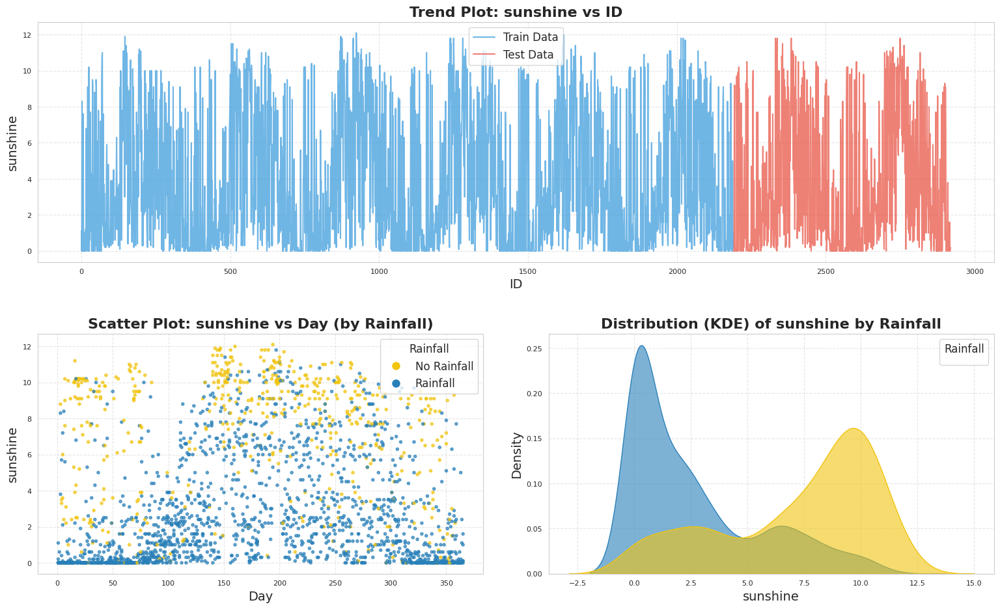

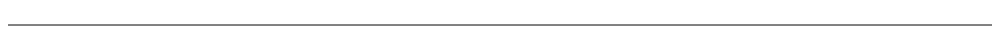

<ipython-input-39-96752400162a>:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(title='Rainfall', fontsize=12, title_fontsize=12)


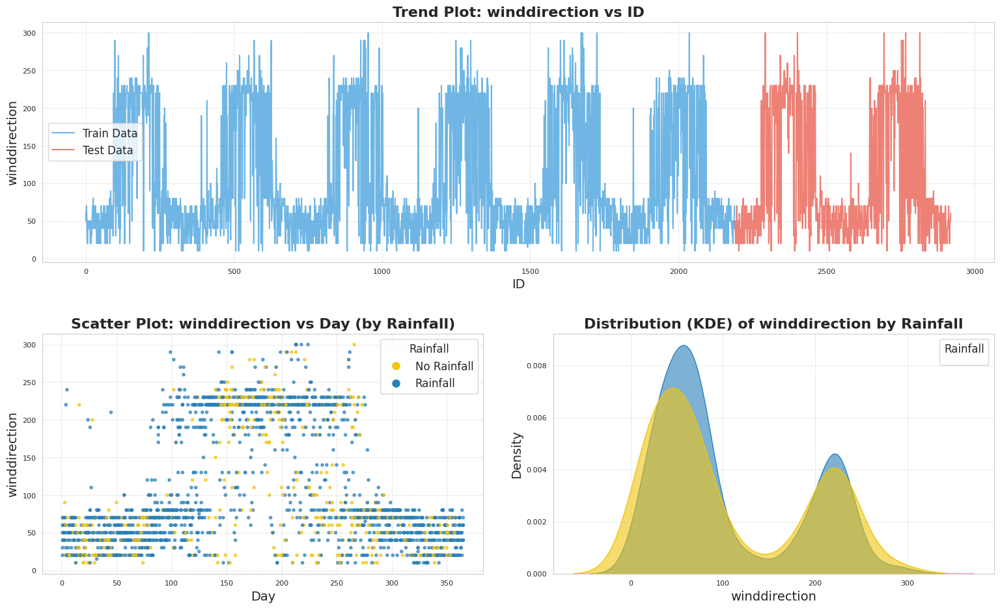

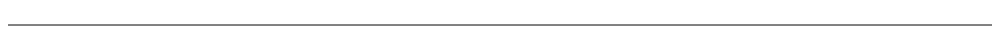

<ipython-input-39-96752400162a>:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(title='Rainfall', fontsize=12, title_fontsize=12)


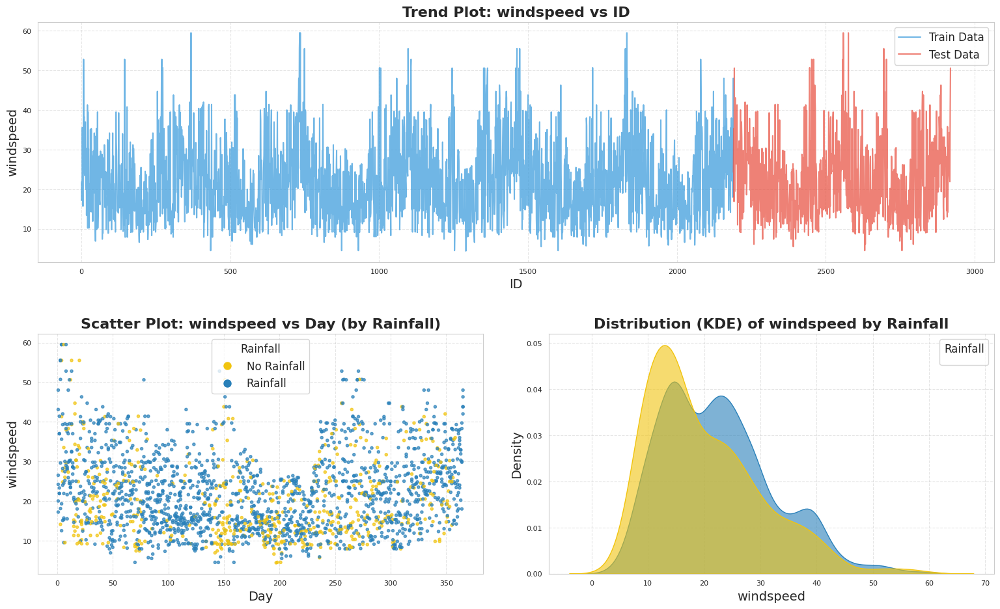

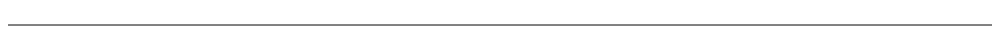

In [ ]:
# Define colors
train_color = '#3498db'  # Blue
test_color = '#e74c3c'   # Red
rainfall_colors = {0: '#f1c40f', 1: '#2980b9'}  # Dark Yellow (no rainfall), Blue (rainfall)

# Numerical columns to plot
numerical_columns = test.select_dtypes(include=['int64', 'float64']).columns.tolist()
for col in ['id', 'day', 'rainfall']:
    if col in numerical_columns:
        numerical_columns.remove(col)

# Plotting loop for each numerical variable
for column in numerical_columns:
    # Create figure with specific layout
    fig = plt.figure(figsize=(16, 10))
    gs = fig.add_gridspec(2, 2, height_ratios=[1, 1])

    # ---- Trend Plot (ID vs Variable) ----
    ax0 = fig.add_subplot(gs[0, :])
    ax0.plot(train['id'], train[column], linestyle='-', color=train_color, label='Train Data', alpha=0.7)
    ax0.plot(test['id'], test[column], linestyle='-', color=test_color, label='Test Data', alpha=0.7)

    ax0.set_xlabel('ID', fontsize=14)
    ax0.set_ylabel(column, fontsize=14)
    ax0.set_title(f'Trend Plot: {column} vs ID', fontsize=16, fontweight='bold')
    ax0.legend(fontsize=12)
    ax0.grid(True, linestyle='--', alpha=0.5)

    # ---- Scatter Plot (Day vs Variable) ----
    ax1 = fig.add_subplot(gs[1, 0])
    scatter = ax1.scatter(
        train['day'], train[column],
        c=train['rainfall'].map(rainfall_colors), alpha=0.7
    )
    ax1.set_xlabel('Day', fontsize=14)
    ax1.set_ylabel(column, fontsize=14)
    ax1.set_title(f'Scatter Plot: {column} vs Day (by Rainfall)', fontsize=16, fontweight='bold')

    # Custom legend for rainfall
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', label='No Rainfall',
               markersize=10, markerfacecolor=rainfall_colors[0]),
        Line2D([0], [0], marker='o', color='w', label='Rainfall',
               markersize=10, markerfacecolor=rainfall_colors[1])
    ]
    ax1.legend(handles=legend_elements, title="Rainfall", fontsize=12, title_fontsize=12)
    ax1.grid(True, linestyle='--', alpha=0.5)

    # ---- KDE Plot (Variable distribution by Rainfall) ----
    ax2 = fig.add_subplot(gs[1, 1])
    sns.kdeplot(data=train, x=column, hue='rainfall', palette=rainfall_colors, ax=ax2, fill=True, common_norm=False, alpha=0.6)

    ax2.set_xlabel(column, fontsize=14)
    ax2.set_ylabel('Density', fontsize=14)
    ax2.set_title(f'Distribution (KDE) of {column} by Rainfall', fontsize=16, fontweight='bold')
    ax2.legend(title='Rainfall', fontsize=12, title_fontsize=12)
    ax2.grid(True, linestyle='--', alpha=0.5)

    # Adjust layout spacing
    plt.tight_layout(pad=3.0)
    plt.show()

    # ---- Add clear separation after each variable ----
    plt.figure(figsize=(16, 0.3))  # Adjust spacing
    plt.axhline(y=0, color='gray', linewidth=5, linestyle='-')
    plt.axis('off')
    plt.show()

- Scatter and KDE plots illustrate how each feature's distribution varies over time, distinguishing clearly between rainy and non-rainy days.

- Features that clearly separate distributions for rain vs. no rain indicate strong predictive power for rainfall.

## Outlier Detection

In [ ]:
from scipy import stats

# Z-score method
z_scores = stats.zscore(train[Features])
train_outliers = (np.abs(z_scores) > 3).any(axis=1)

# Z-score method
z_scores = stats.zscore(orig[Features])
orig_outliers = (np.abs(z_scores) > 3).any(axis=1)

In [ ]:
train_no_outliers = train[~train_outliers]
orig_no_outliers = orig[~orig_outliers]

print(train_no_outliers.shape)
print(orig_no_outliers.shape)

(2110, 13)
(355, 12)


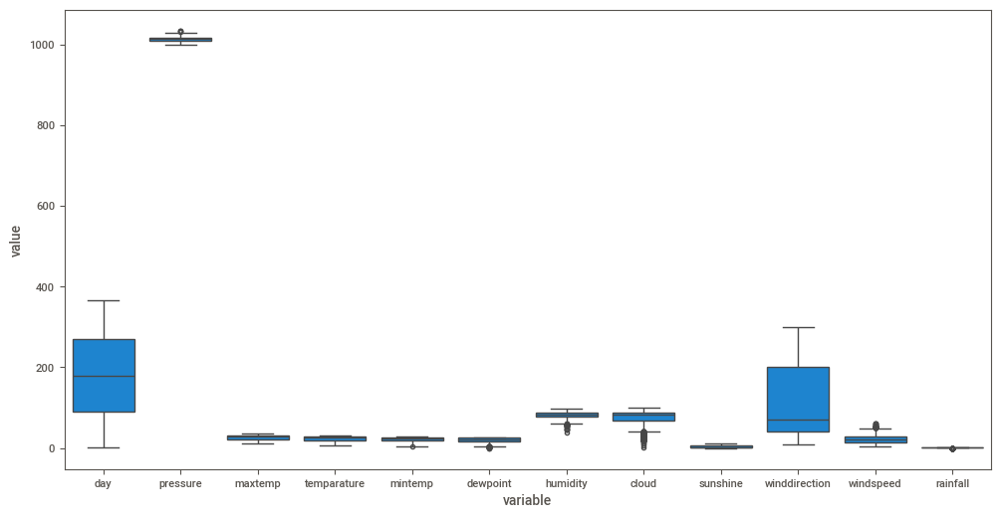

In [ ]:
# Widely different ranges of values in different columns. Scaling needed for some models
plt.figure(figsize=(12, 6))
sns.boxplot(x="variable", y="value", data=pd.melt(train))
plt.show()

## Correlation between features

In [ ]:
from scipy.stats import pointbiserialr

# Compute correlation between cloud and rainfall
correlation, p_value = pointbiserialr(train["rainfall"], train["cloud"])
print(f"Point Biserial Correlation for cloud: {correlation:.3f}, p-value: {p_value:.6f}")

# Compute correlation between sunshine and rainfall
correlation, p_value = pointbiserialr(train["rainfall"], train["sunshine"])
print(f"Point Biserial Correlation for sunshine: {correlation:.3f}, p-value: {p_value:.6f}")

Point Biserial Correlation for cloud: 0.641, p-value: 0.000000
Point Biserial Correlation for sunshine: -0.555, p-value: 0.000000


As expected, there is correlation between features such as winddirection, temp, mintemp, maxtemp, dewpoint and pressure

In [ ]:
# Compute correlation between temperature and rainfall
correlation, p_value = pointbiserialr(train["rainfall"], train["temparature"])
print(f"Point Biserial Correlation between temp and rainfall: {correlation:.3f}, p-value: {p_value:.3f}")

# Compute correlation between mintemp and rainfall
correlation, p_value = pointbiserialr(train["rainfall"], train["mintemp"])
print(f"Point Biserial Correlation between mintemp and rainfall: {correlation:.3f}, p-value: {p_value:.3f}")

# Compute correlation between maxtemp and rainfall
correlation, p_value = pointbiserialr(train["rainfall"], train["maxtemp"])
print(f"Point Biserial Correlation between maxtemp and rainfall: {correlation:.3f}, p-value: {p_value:.6f}")

Point Biserial Correlation between temp and rainfall: -0.050, p-value: 0.020
Point Biserial Correlation between mintemp and rainfall: -0.027, p-value: 0.209
Point Biserial Correlation between maxtemp and rainfall: -0.079, p-value: 0.000203


In [ ]:
train['avgtemp'] = train['maxtemp'] + train['mintemp'] / 2
test['avgtemp'] = test['maxtemp'] + test['mintemp'] / 2

In [ ]:
# Compute correlation between  avg temperature and rainfall
correlation, p_value = pointbiserialr(train["rainfall"], train["avgtemp"])
print(f"Point Biserial Correlation between avgtemp and rainfall: {correlation:.3f}, p-value: {p_value:.6f}")

Point Biserial Correlation between avgtemp and rainfall: -0.064, p-value: 0.002924


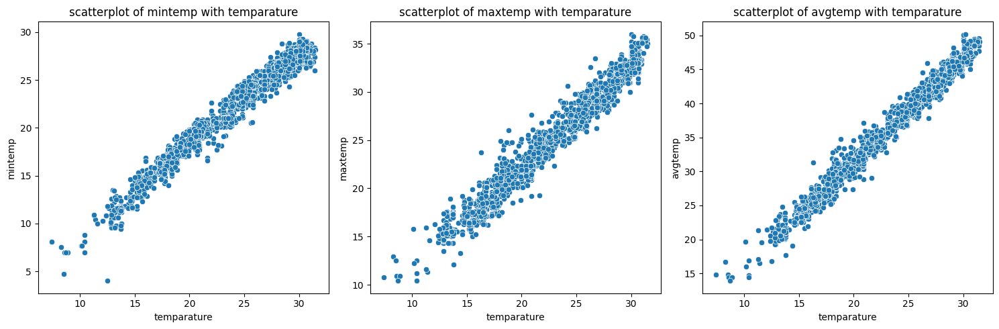

In [ ]:
temp_features = ['mintemp', 'maxtemp', 'avgtemp']
num_features = len(temp_features)
cols = 3  # Number of columns in the grid
rows = (num_features // cols) + (num_features % cols > 0)  # Dynamically determine rows

# Set figure size
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
axes = axes.flatten()  # Flatten in case of 2D array

# Plot each feature's boxplot
for i, feature in enumerate(temp_features):
    sns.scatterplot(x=train['temparature'], y=train[feature], ax=axes[i])
    axes[i].set_title(f"scatterplot of {feature} with temparature")

# Hide any unused subplots (if num_features < rows * cols)
for i in range(num_features, len(axes)):
    fig.delaxes(axes[i])  # Remove empty plots

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

In [ ]:
# Compute Pearson correlation between temperature and maxtemp
pearson_corr = train["temparature"].corr(train["maxtemp"], method="pearson")
print(f"Pearson Correlation between temp amd max temp: {pearson_corr:.3f}")

# Compute Pearson correlation between temperature and mintemp
pearson_corr = train["temparature"].corr(train["mintemp"], method="pearson")
print(f"Pearson Correlation between temp and mintemp: {pearson_corr:.3f}")

# Compute Pearson correlation between temperature and avgtemp
pearson_corr = train["temparature"].corr(train["avgtemp"], method="pearson")
print(f"Pearson Correlation between temp and avgtemp: {pearson_corr:.3f}")

# Compute Pearson correlation between mintemp and maxtemp
pearson_corr = train["mintemp"].corr(train["maxtemp"], method="pearson")
print(f"Pearson Correlation between mintemp and maxtemp: {pearson_corr:.3f}")

Pearson Correlation between temp amd max temp: 0.983
Pearson Correlation between temp and mintemp: 0.987
Pearson Correlation between temp and avgtemp: 0.992
Pearson Correlation between mintemp and maxtemp: 0.966


<Axes: xlabel='cloud', ylabel='humidity'>

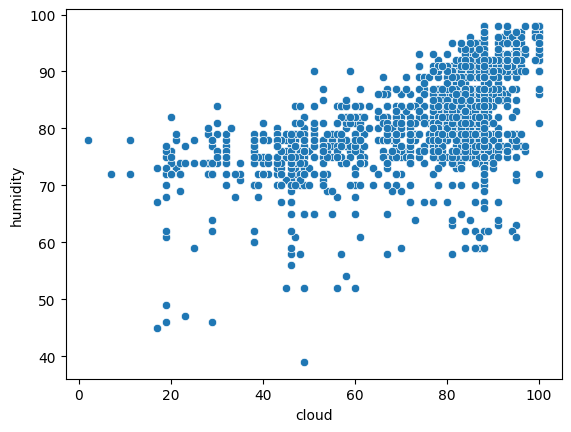

In [ ]:
sns.scatterplot(x=train['cloud'], y=train['humidity'])

In [ ]:
pearson_corr = train["cloud"].corr(train["humidity"], method="pearson")
print(f"Pearson Correlation between cloud and humidity: {pearson_corr:.6f}")

Pearson Correlation between cloud and humidity: 0.584854


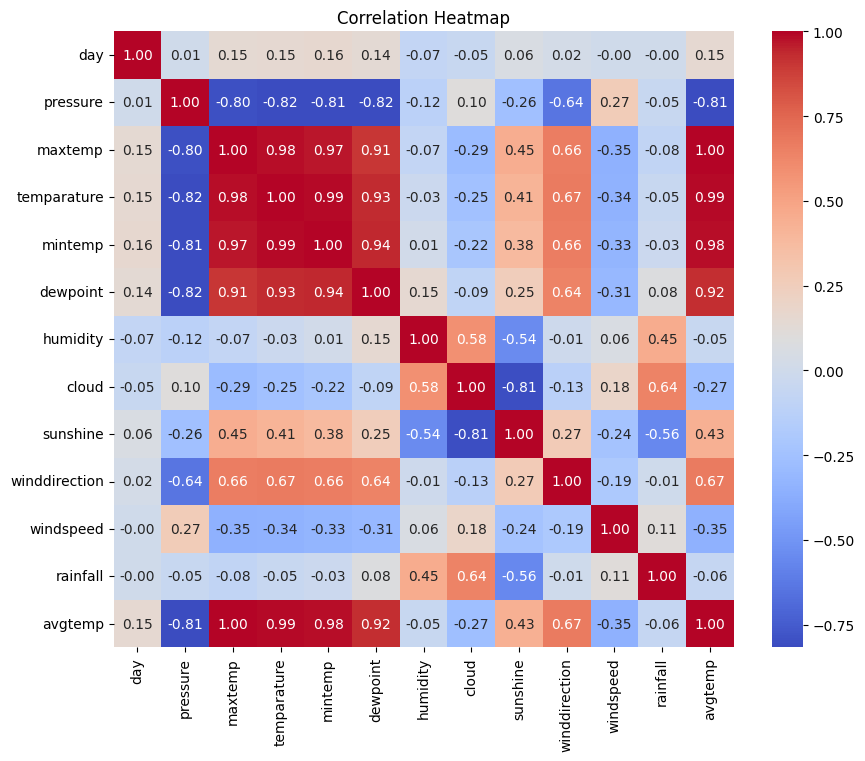

In [ ]:
correlation_matrix = train.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
corr_with_rainfall = correlation_matrix["rainfall"].sort_values(ascending=False)
print("\nCorrelation of Features with Rainfall:\n", corr_with_rainfall)


Correlation of Features with Rainfall:
 rainfall         1.000000
cloud            0.641191
humidity         0.454213
windspeed        0.111625
dewpoint         0.081965
day             -0.000462
winddirection   -0.006939
mintemp         -0.026841
temparature     -0.049660
pressure        -0.049886
avgtemp         -0.063558
maxtemp         -0.079304
sunshine        -0.555287
Name: rainfall, dtype: float64


## Principle Component Analysis (PCA)

Explained variance: [0.50117047 0.20370048 0.09271863 0.07747321 0.04460645 0.03608945]
Total explained variance: 0.9557586820732817


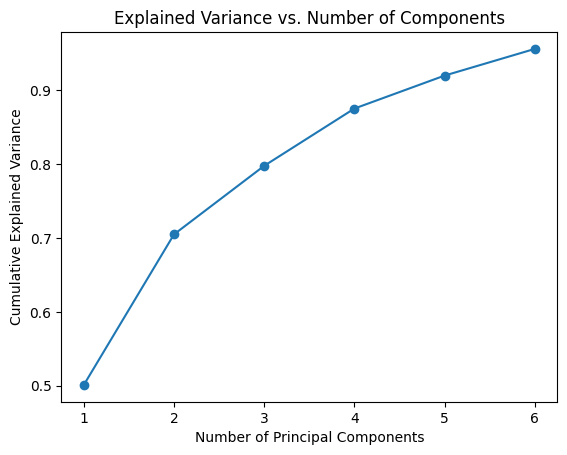

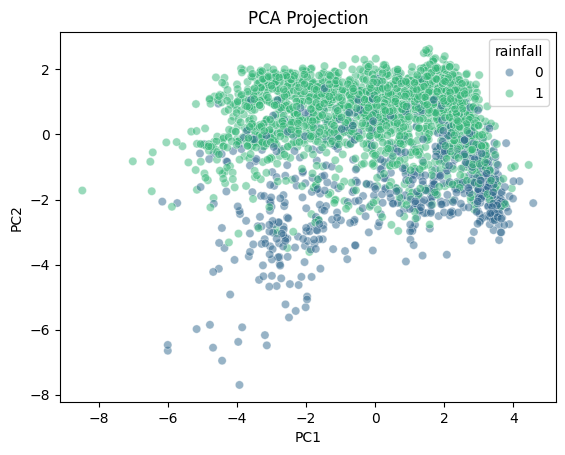

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

df_train = pd.concat([train.drop(columns=['id']), orig], axis=0)

# Standardize features (important if scales differ)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_train[Features])

# Apply PCA
pca = PCA(n_components=6)  # Choose how many components
X_pca = pca.fit_transform(X_scaled)

# Explained variance ratio
print("Explained variance:", pca.explained_variance_ratio_)
print("Total explained variance:", sum(pca.explained_variance_ratio_))

# Scree plot (to determine number of components)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.show()

# Scatter plot of first two PCs
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], alpha=0.5, hue=df_train['rainfall'], palette='viridis')
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA Projection")
plt.show()

In [ ]:
# Get loadings (feature contributions to each PC)
loadings = pd.DataFrame(
    pca.components_.T,  # Transpose to get features as rows
    columns=[f'PC{i+1}' for i in range(pca.n_components_)],
    index=df_train[Features].columns  # Use feature names as index
)

print(loadings)  # Display the loadings

                    PC1       PC2       PC3       PC4       PC5       PC6
day            0.048390  0.021908  0.960602 -0.195414  0.084821  0.116000
pressure      -0.366060 -0.159063  0.115754 -0.094695  0.031872  0.011693
maxtemp        0.414864  0.005445  0.032183  0.026804 -0.112431 -0.169745
temparature    0.416694  0.047170  0.039330  0.038483 -0.124310 -0.166239
mintemp        0.412358  0.075142  0.049601  0.043124 -0.140126 -0.161148
dewpoint       0.393094  0.189583  0.025787  0.008688 -0.169325 -0.075466
humidity      -0.016032  0.563605 -0.078876 -0.135808 -0.374011  0.696709
cloud         -0.134884  0.576449  0.017599 -0.023520  0.224672 -0.356123
sunshine       0.210233 -0.517979 -0.016502  0.041607 -0.176492  0.355063
winddirection  0.314196  0.074657 -0.067404  0.250466  0.803459  0.399728
windspeed     -0.178839  0.080976  0.216309  0.930188 -0.219848  0.014706


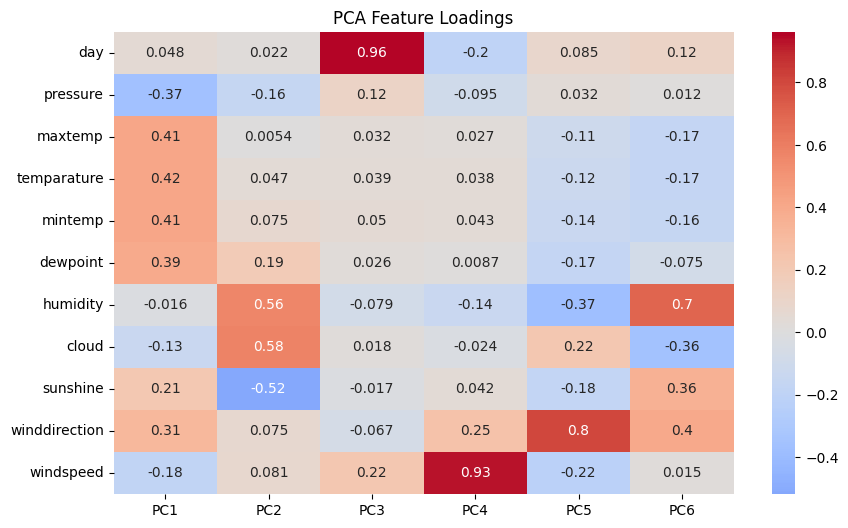

In [ ]:
plt.figure(figsize=(10,6))
sns.heatmap(loadings, annot=True, cmap='coolwarm', center=0)
plt.title("PCA Feature Loadings")
plt.show()

In [ ]:
X_pca_df = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(pca.n_components_)])
X_pca_df.shape

(2556, 6)

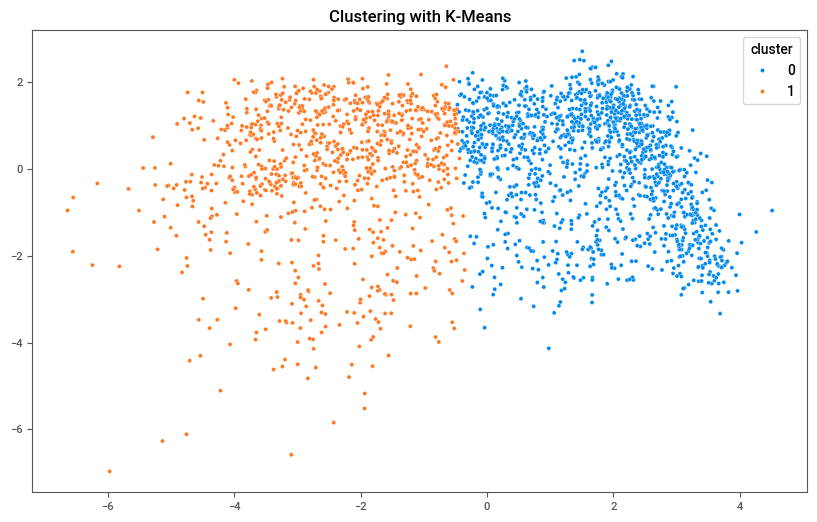

In [ ]:
from sklearn.cluster import KMeans

# Apply K-Means clustering
kmeans = KMeans(n_clusters=2)

train_kmeans= train.copy()
train_kmeans['cluster'] = kmeans.fit_predict(X_scaled)

# Visualize clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=train_kmeans['cluster'])
plt.title('Clustering with K-Means')
plt.show()